In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [76]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [77]:
import DiadFit as pf
pf.__version__

'0.0.34'

In [78]:
DayFolder=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\Diad_Fitting_Nov22nd2022'
meta_path=DayFolder +  '\MetaData'
spectra_path=DayFolder + '\Spectra'

In [79]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt' # Specifies raman file format 
file_ext='.txt'
prefix=False

## Now load the files of interest

In [80]:
Diad_Files_Weak = joblib.load('Diad_Files_Grp2.sav')

In [81]:
Diad_Files_Weak

['POC39.txt',
 'POC30.txt',
 'POC38.txt',
 'POC20.txt',
 'POC29.txt',
 'POC37.txt',
 'POC19.txt',
 'POC25.txt',
 'POC26.txt',
 'POC24.txt',
 'POC23.txt',
 'POC28.txt',
 'POC18.txt',
 'POC22.txt',
 'POC27.txt',
 'POC21.txt',
 'POC36.txt',
 'POC17.txt',
 'POC35.txt',
 'POC11.txt',
 'POC16.txt',
 'POC15.txt',
 'POC34.txt',
 'POC10.txt',
 'POC9.txt',
 'POC14.txt',
 'POC13.txt',
 'POC33.txt',
 'POC12.txt',
 'POC32.txt',
 'POC31.txt']

In [82]:
# Select one file to tweak fit on
filename_Weak=Diad_Files_Weak[1]
filename_Weak

'POC30.txt'

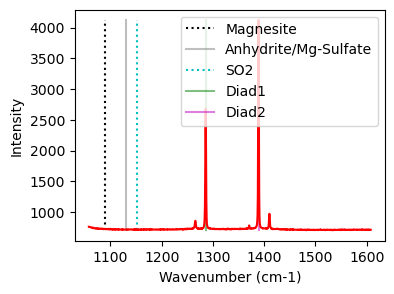

In [83]:
plot1=pf.plot_diad(path=spectra_path, filename=filename_Weak, filetype=filetype)

## Decide if you want a secondary peak
- If you dont have the peak, it is only a little slower, but it works if it only appears in a small number of spectra still

In [84]:
# Decide if you want to fit a carbonate peak or not here. 
fit_sec_peak=False

if fit_sec_peak is True:

    # Tweak options here, can exclude a range for example using exclude_range=Tuple[float, float]
    generic_Config=pf.generic_peak_config(lower_bck=(1110, 1130), 
    upper_bck=(1160, 1180), cent_generic=1150, name='SO2')

    generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename_Weak, filetype=filetype)
    generic_fit

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [85]:
diad_id_config=pf.diad_id_config(height=50)
diad_id_config

diad_id_config(exclude_range1=None, exclude_range2=None, approx_diad2_pos=(1379, 1395), approx_diad1_pos=(1275, 1295), Diad2_window=(1349, 1425), Diad1_window=(1245, 1325), approx_diad2_pos_3peaks=(1379, 1395, 1362), height=50, distance=5, threshold=0.5, width=0.5, prominence=10, plot_figure=True)

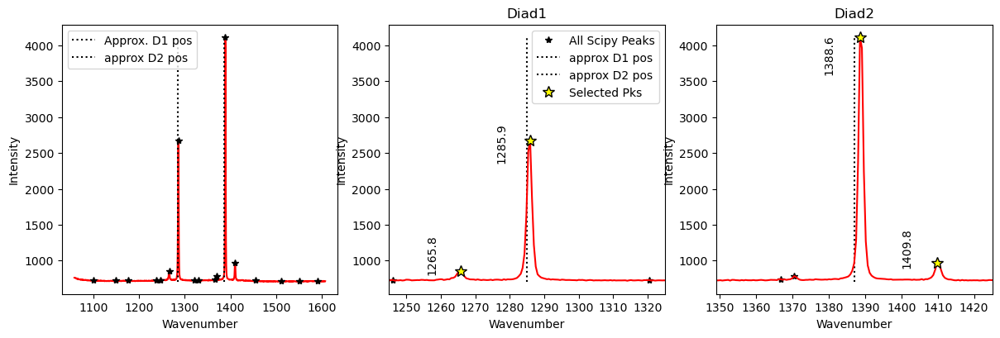

In [86]:
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands
n_peaks_diad1=2
n_peaks_diad2=2
    
diad1_peaks, diad2_peaks=pf.identify_diad_peaks(
    config=diad_id_config, path=spectra_path, filename=filename_Weak,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, n_peaks_diad2=n_peaks_diad2)

In [87]:
## Choose a model - option, pseudovoigt or voigt
model_name='PseudoVoigtModel'

## Fit Diad 1
- You can tweak the parameters in diad1_fit_config

In [88]:
diad1_fit_config_init=pf.diad1_fit_config(model_name=model_name,
N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220),
diad_sigma=0.6, sigma_allowance=2,
x_range_residual=10, x_range_baseline=30, HB_amplitude=5, diad_amplitude=1000)
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6, sigma_allowance=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1300, 1350), diad_amplitude=1000, HB_amplitude=5, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,Diad1_Combofit_Height,Residual_Diad1,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1285.703458,1285.703508,4367.811216,0.819773,None,1265.198736,406.007342,2056.643926,5.668565,0.553114,1.639545,False


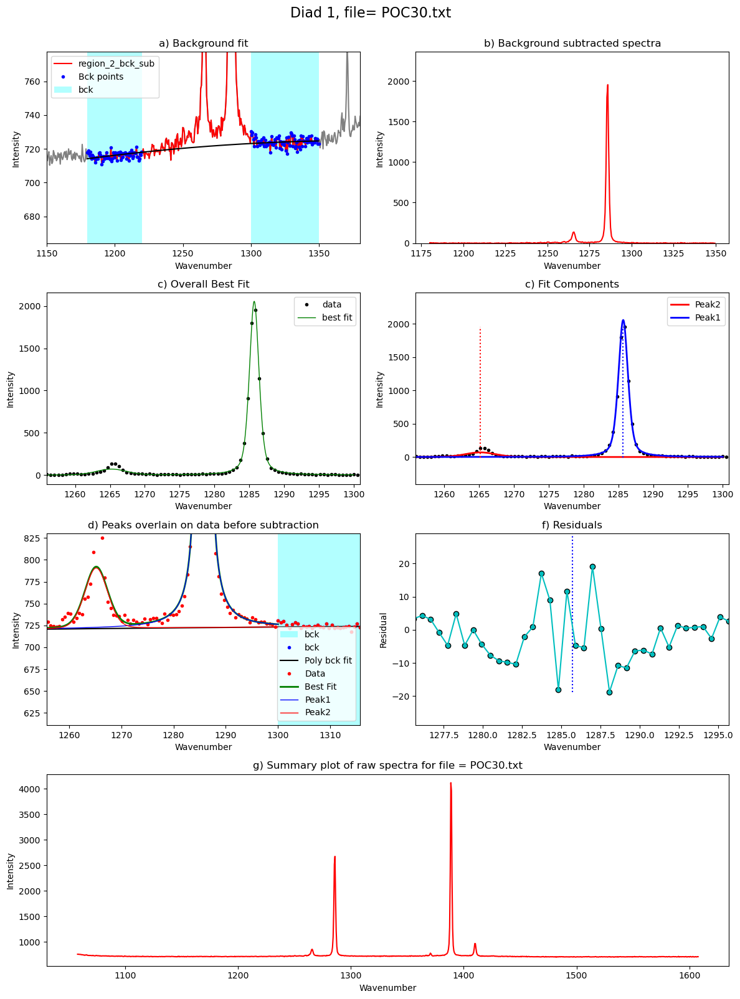

In [89]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad1_fit

In [90]:
### Now lets update the tweakable parameters with the sigma values
diad1_fit_config=diad1_fit_config_init
diad1_fit_config.diad_sigma=Diad1_fit['Diad1_Voigt_Sigma'][0]
diad1_fit_config.diad_amplitude=Diad1_fit['Diad1_Voigt_Area'][0]
diad1_fit_config.HB_amplitude=Diad1_fit['HB1_Area'][0]
diad1_fit_config.sigma_allowance=2
diad1_fit_config

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.8197727337682432, sigma_allowance=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1300, 1350), diad_amplitude=4367.811215902799, HB_amplitude=406.00734227358225, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## Fit diad 2

In [91]:
diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
diad_sigma=0.5,  N_poly_bck_diad2=2,
HB_amplitude=100,                                          
x_range_residual=10, 
diad_amplitude=6000, 
x_range_baseline=30)
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.5, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=2, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=6000, HB_amplitude=100, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,Diad2_Combofit_Height,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1388.828984,1388.828934,6763.023247,0.710553,None,1410.08745,681.92819,3711.010478,5.119946,0.527448,1.421106,False


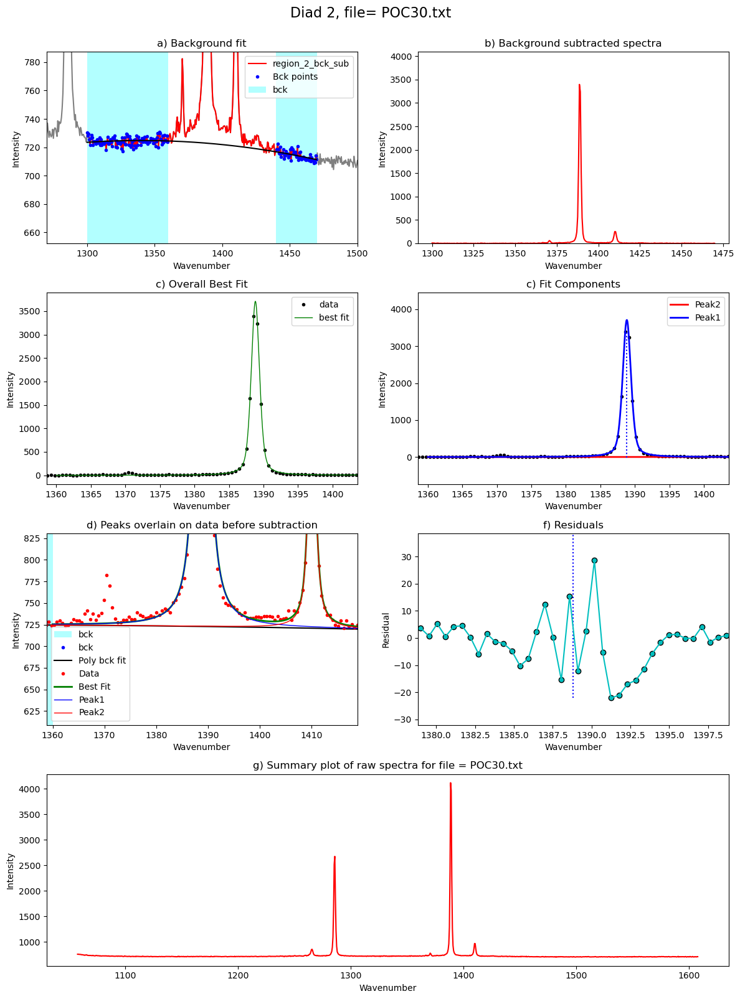

In [92]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config, peak_pos_voigt=diad2_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

In [93]:
# Update param with new sigma
diad2_fit_config=diad2_fit_config_init
diad2_fit_config.diad_sigma=Diad2_fit['Diad2_Voigt_Sigma'][0]
diad2_fit_config.sigma_allowance=2
diad2_fit_config.diad_amplitude=Diad2_fit['Diad2_Voigt_Area'][0]
diad2_fit_config.HB_amplitude=Diad2_fit['HB2_Area'][0]
diad2_fit_config

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.7105528365848499, C13_sigma=0.1, sigma_allowance=2, N_poly_bck_diad2=2, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=6763.02324706289, HB_amplitude=681.9281896997406, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## You can also try looping if all your spectra are pretty similar

 23%|██████████████████▋                                                                | 7/31 [00:15<00:53,  2.22s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:3333: UserWarning: Diad fit right at the lower limit of the allowed fit parameter, change diad_sigma in the diad 2 config file
  w.warn('Diad fit right at the lower limit of the allowed fit parameter, change diad_sigma in the diad 2 config file')
 32%|██████████████████████████▍                                                       | 10/31 [00:22<00:43,  2.09s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:1902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
100%|█████████████████████████████████████████████

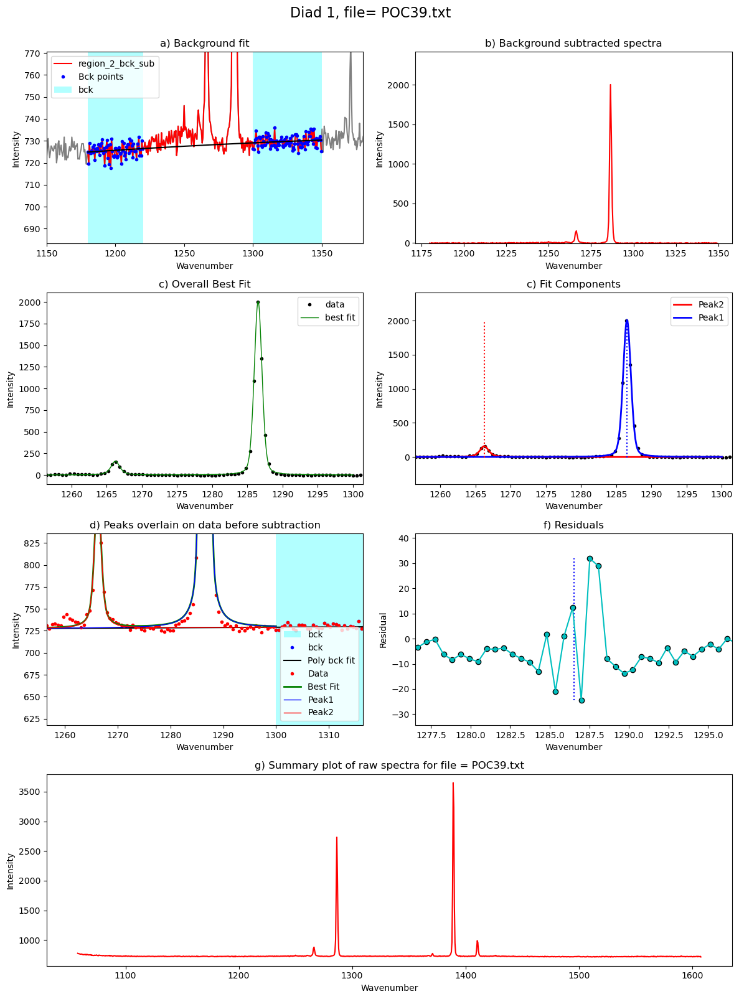

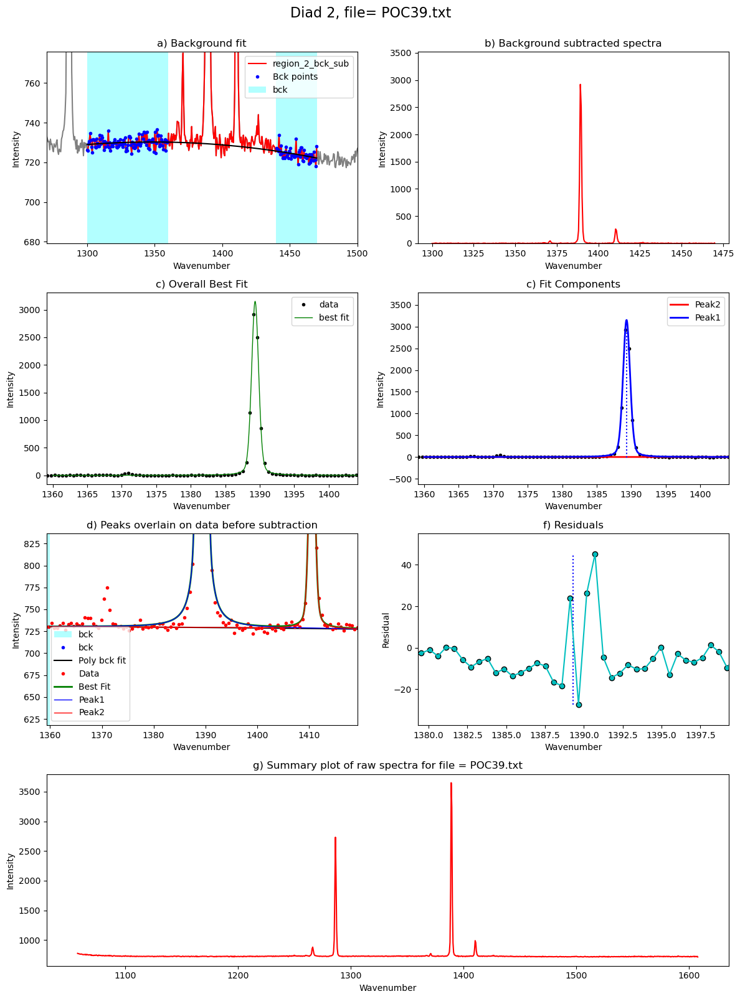

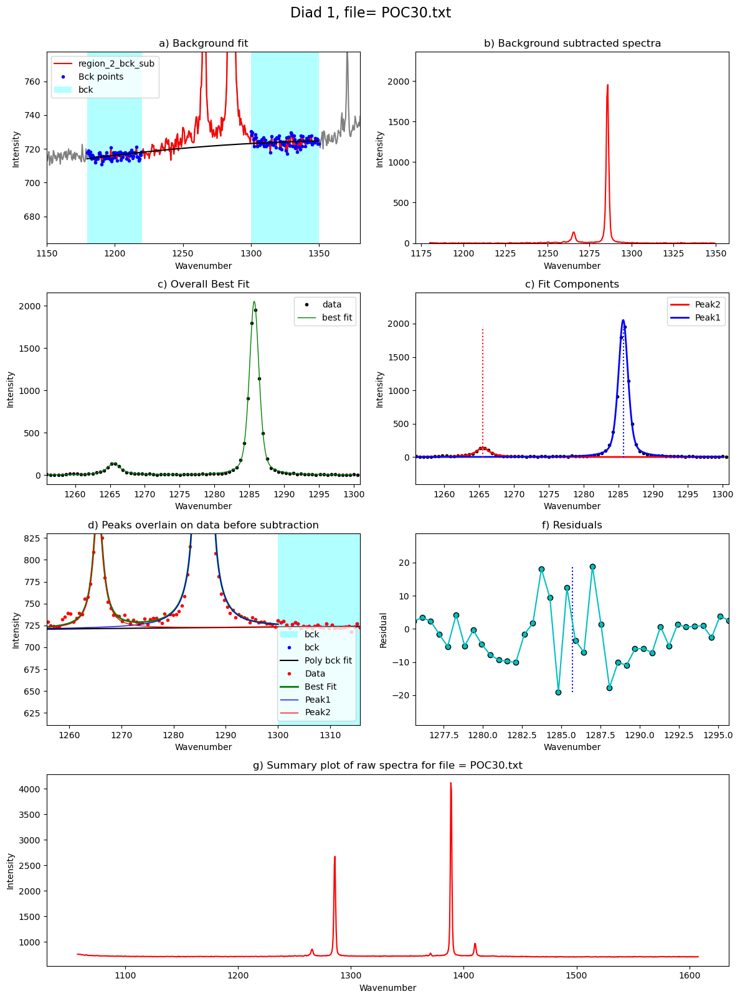

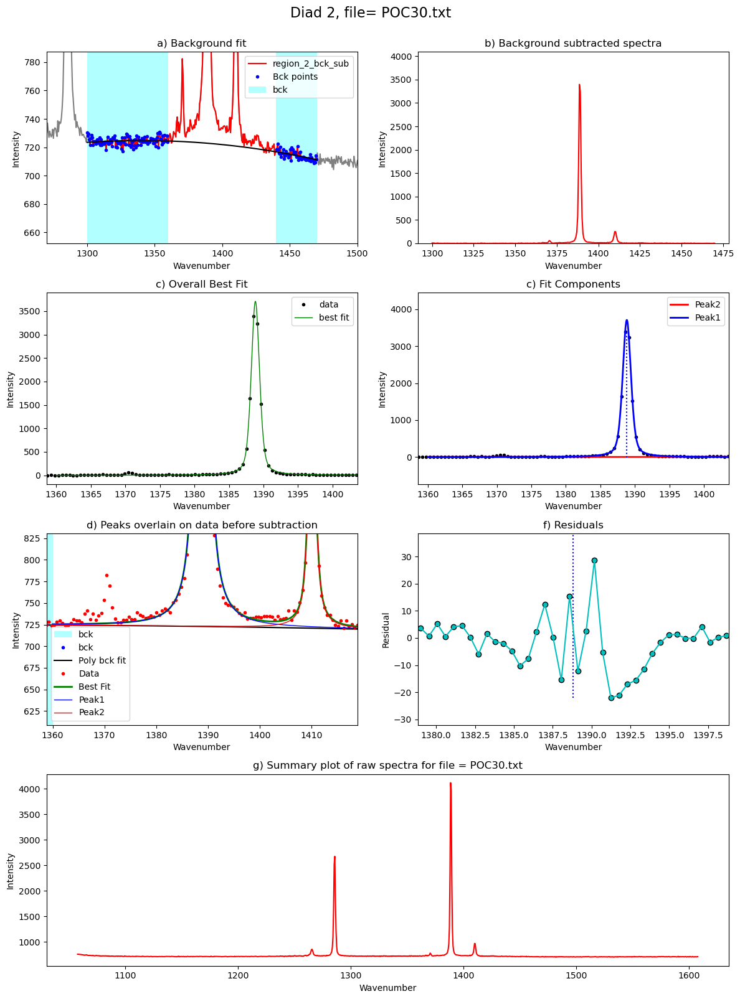

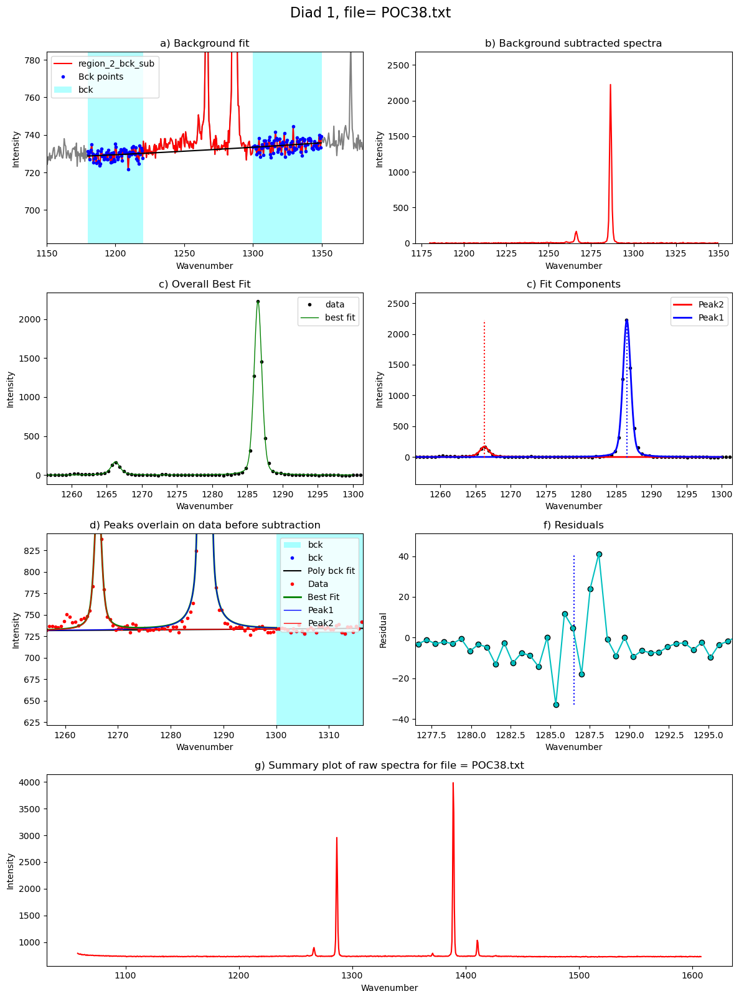

...

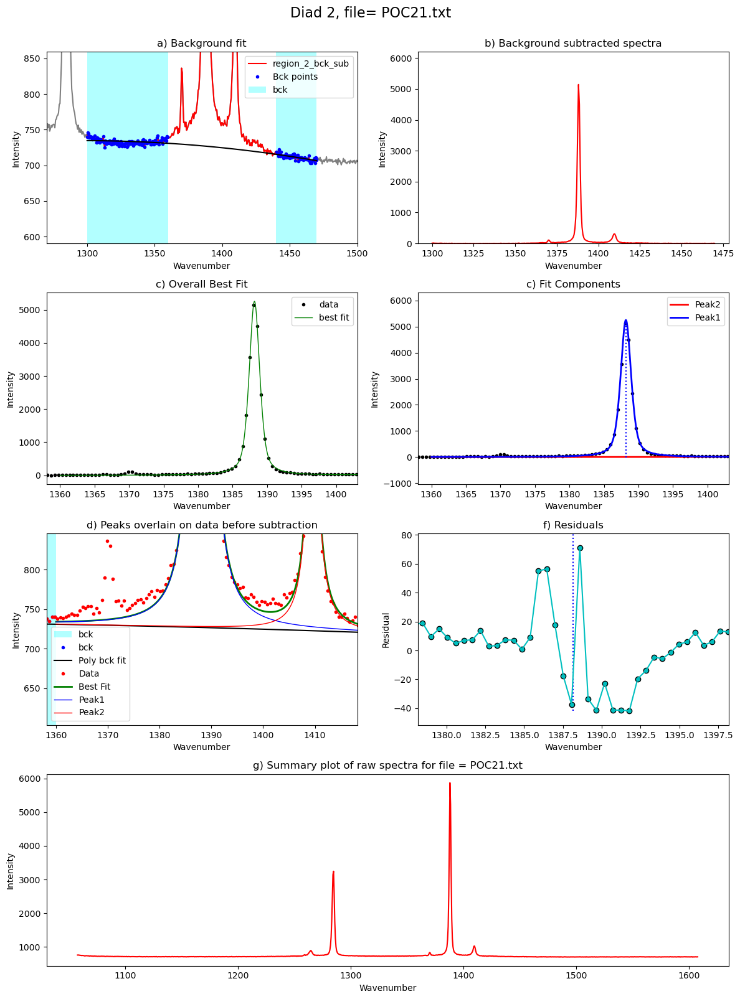

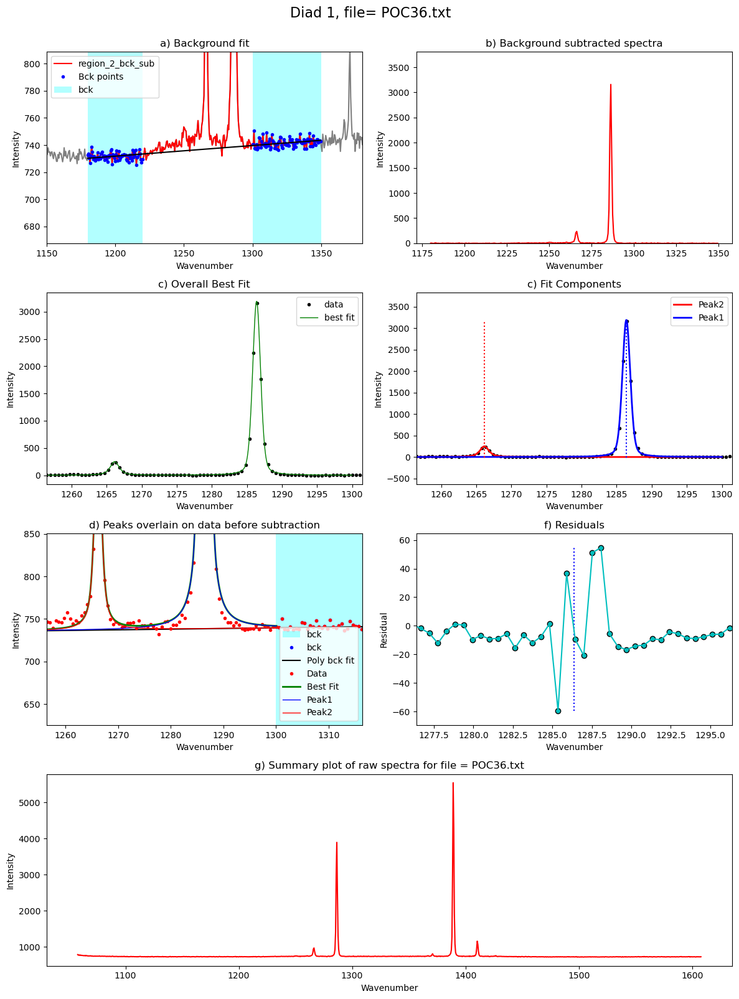

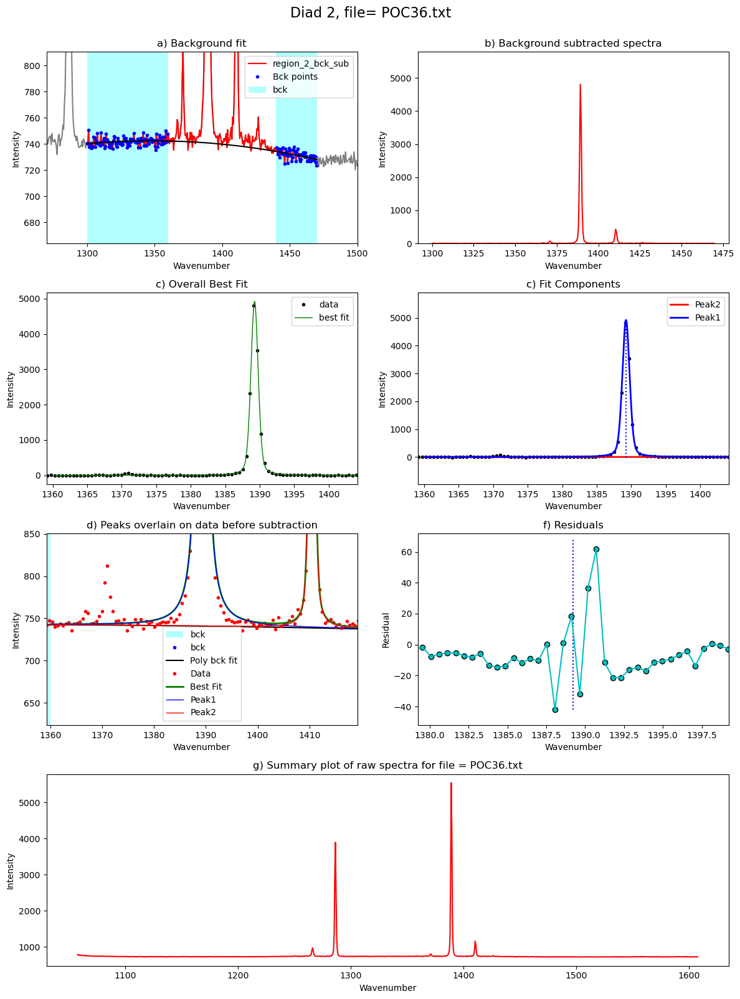

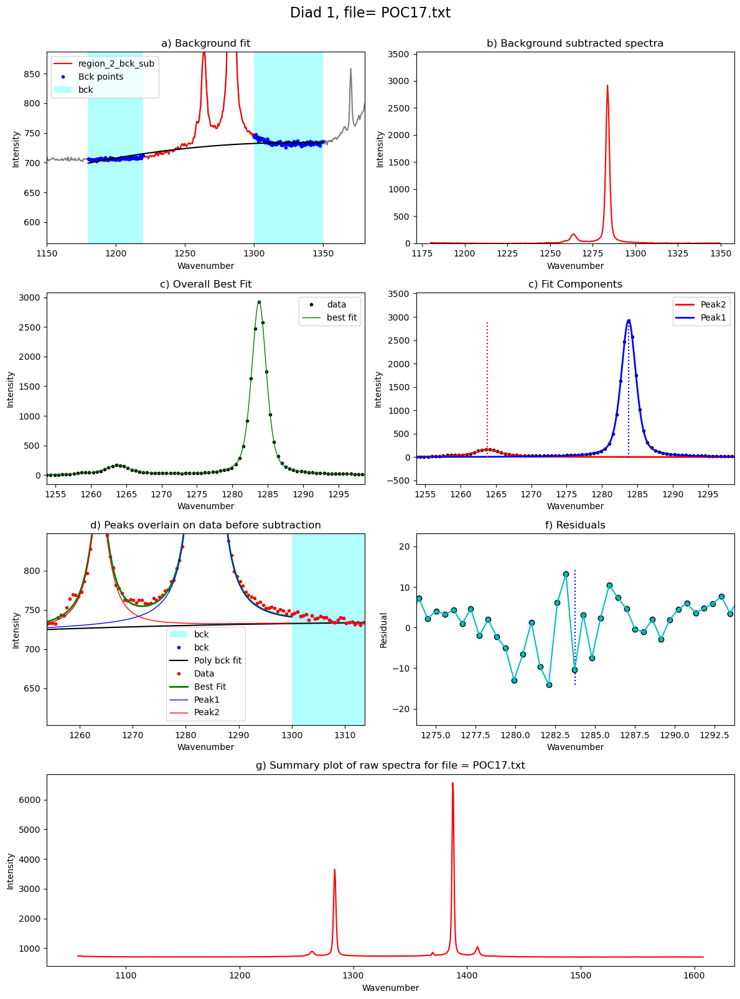

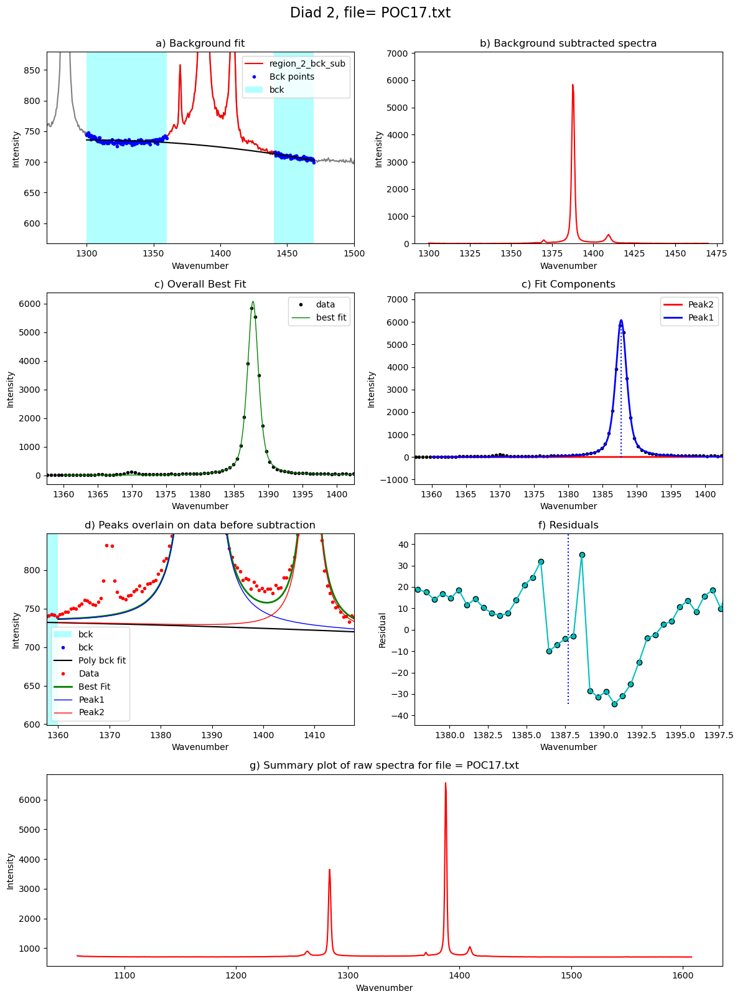

In [ ]:
from tqdm import tqdm
plot_figure=False # If False, Means doesnt have to make figures, lot faster. 
close_figure=False # Means shows figures in the notebook itself
to_clipboard=False # Copies to clipboard
Diad_Files_Weak_i=Diad_Files_Weak
df_Weak = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files_Weak))): #
    
    filename=Diad_Files_Weak[i]

    if fit_sec_peak is True:
    
        generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
filename=filename, filetype=filetype)


    diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
            path=spectra_path, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
    n_peaks_diad2=n_peaks_diad2, plot_figure=False)

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)

    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,
    path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)
    
    if fit_sec_peak is True:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)
        
    
    else:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit)        
    

    df_Weak = pd.concat([df_Weak, data], axis=0)


## Here are some figures to inspect the relationship between residuals and areas etc. 

In [61]:
df_Weak['Diad1_refit']

0    False
0    False
0    False
0    False
0    False
0    False
0    False
0     True
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
0    False
Name: Diad1_refit, dtype: bool

In [62]:
# These ones triggered at least one warning, so need to be refit
refit_d1=(df_Weak['Diad1_refit']==True)
refit_d2=(df_Weak['Diad2_refit']==True)
refit=refit_d1|refit_d2

In [63]:
sum(refit)

1

In [64]:
df_Weak.columns

Index(['filename', 'Splitting', 'Diad1_Combofit_Cent', 'Diad1_Combofit_Height',
       'Diad1_Voigt_Cent', 'Diad1_Voigt_Area', 'Diad1_Voigt_Sigma',
       'Diad1_Voigt_Gamma', 'Residual_Diad1', 'Diad1_Prop_Lor', 'Diad1_fwhm',
       'Diad1_refit', 'Diad2_Combofit_Cent', 'Diad2_Combofit_Height',
       'Diad2_Voigt_Cent', 'Diad2_Voigt_Area', 'Diad2_Voigt_Sigma',
       'Diad2_Voigt_Gamma', 'Residual_Diad2', 'Diad2_Prop_Lor', 'Diad2_fwhm',
       'Diad2_refit', 'HB1_Cent', 'HB1_Area', 'HB2_Cent', 'HB2_Area',
       'C13_Cent', 'C13_Area'],
      dtype='object')

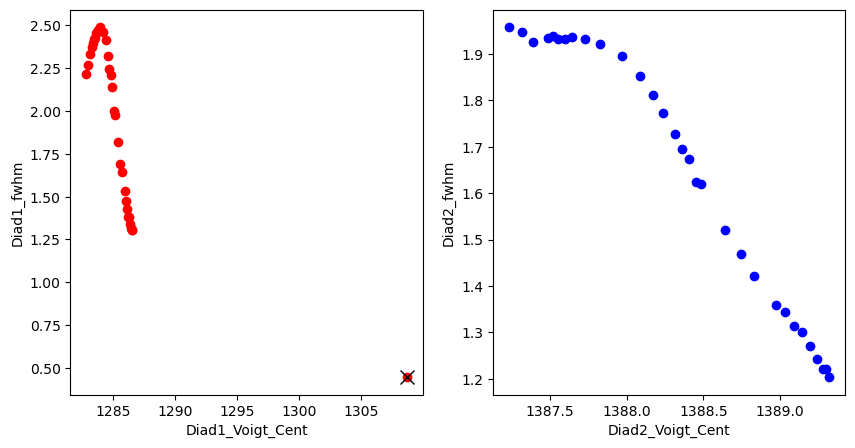

In [65]:

x1='Diad1_Voigt_Cent'
x2='Diad2_Voigt_Cent'
y1='Diad1_fwhm'
y2='Diad2_fwhm'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x1], df_Weak[y1], 'or')
ax2.plot(df_Weak[x2], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x1].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x2].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x1)
ax2.set_xlabel(x2)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

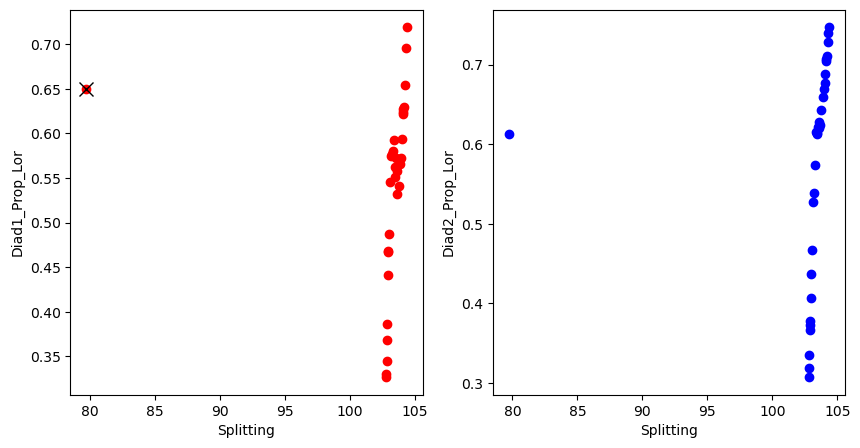

In [66]:

x='Splitting'
y1='Diad1_Prop_Lor'
y2='Diad2_Prop_Lor'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

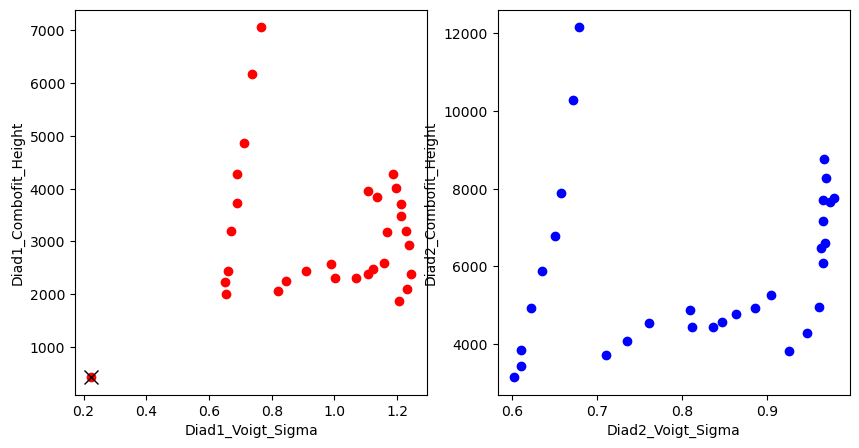

In [67]:
x1='Diad1_Voigt_Sigma'
x2='Diad2_Voigt_Sigma'
y1='Diad1_Combofit_Height'
y2='Diad2_Combofit_Height'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x1], df_Weak[y1], 'or')
ax2.plot(df_Weak[x2], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x1].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x2].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)

ax1.set_xlabel(x1)
ax1.set_ylabel(y1)
ax2.set_xlabel(x2)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

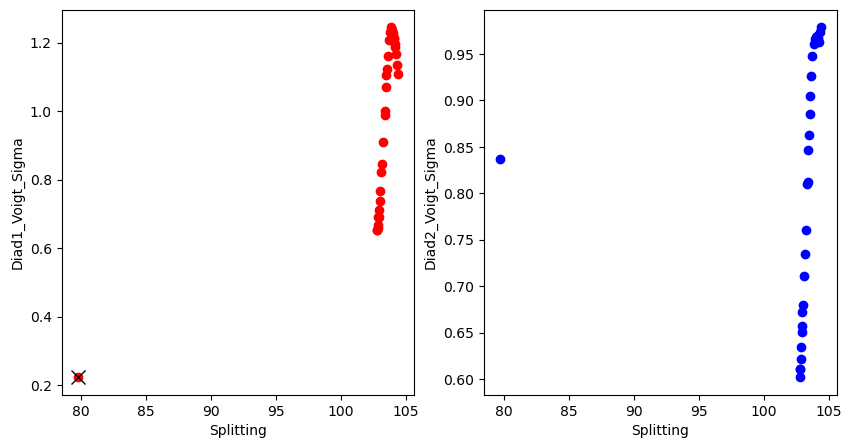

In [68]:
x='Splitting'
y1='Diad1_Voigt_Sigma'
y2='Diad2_Voigt_Sigma'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

In [69]:
df_anom=df_Weak.loc[refit]
df_anom['filename']

0    POC25
Name: filename, dtype: object

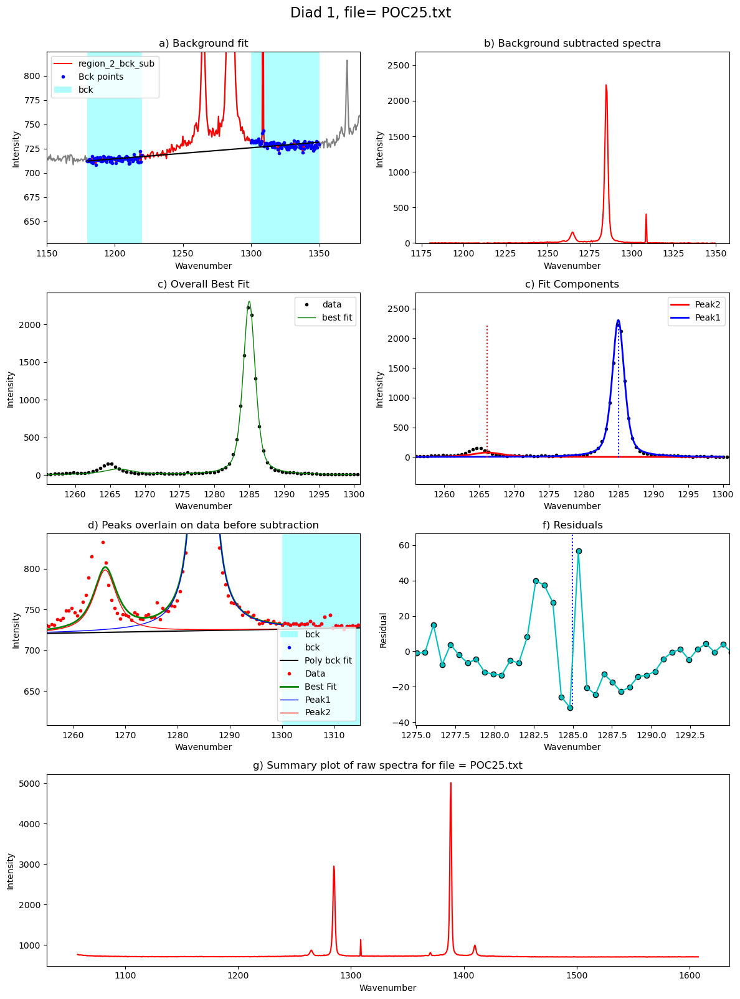

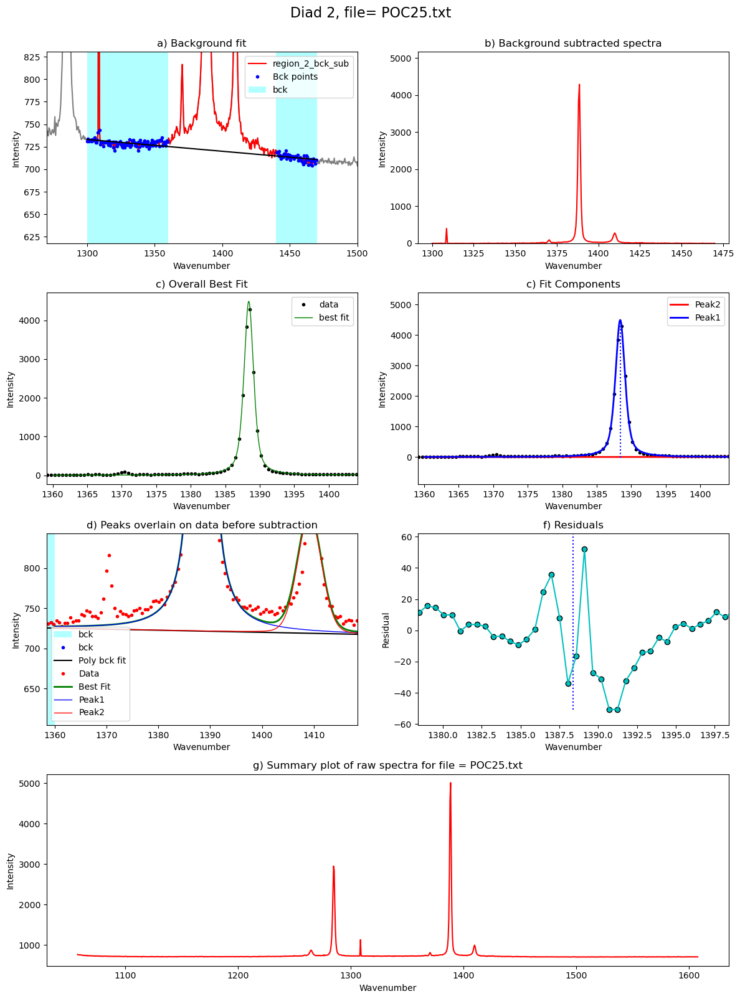

In [70]:
if sum(refit)>0:
    filename_refit=df_anom['filename'].iloc[0] + file_ext

    diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
            path=spectra_path, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
    n_peaks_diad2=n_peaks_diad2, plot_figure=False)    


    diad1_fit_config_refit=pf.diad1_fit_config(model_name=model_name,
    diad_sigma=0.8, sigma_allowance=2,
    x_range_residual=10, 
    x_range_baseline=30, HB_amplitude=5, diad_amplitude=10000)


    diad2_fit_config_refit=pf.diad2_fit_config(model_name=model_name,
    diad_sigma=0.8, sigma_allowance=2,  
                                x_range_residual=10, 
                                diad_amplitude=10000, 
                            x_range_baseline=30)
    diad2_fit_config


    Diad1_refit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_refit,
        config2=diad_id_config, peak_pos_voigt=diad1_peaks,
    path=spectra_path, filename=filename_refit, filetype=filetype, close_figure=False)



    Diad2_refit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_refit,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,                              
    path=spectra_path, filename=filename_refit, filetype=filetype, close_figure=False)



    data_refit=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=None)

    data_refit

In [71]:
len(refit)

31

In [39]:
if sum(refit)>1:
    from tqdm import tqdm
    plot_figure=True # If False, Means doesnt have to make figures, lot faster. 
    close_figure=False # Means shows figures in the notebook itself
    to_clipboard=False # Copies to clipboard

    df_Weak_refit = pd.DataFrame([])
    for i in tqdm(range(0, len(df_anom))):

        filename=df_anom['filename'].iloc[i] + file_ext

        generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename, filetype=filetype)


        diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
                path=spectra_path, filename=filename,
    filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
        n_peaks_diad2=n_peaks_diad2, plot_figure=False)

        Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_refit,
        config2=diad_id_config, peak_pos_voigt=diad1_peaks,
    path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)

        Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_refit,
            config2=diad_id_config, peak_pos_voigt=diad2_peaks,
        path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)



        data_refit=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)
    
 

        df_Weak_refit = pd.concat([df_Weak_refit, data_refit], axis=0)
    
else:
    df_Weak_refit=data_refit

  0%|                                                                                           | 0/31 [00:00<?, ?it/s]


NameError: name 'generic_Config' is not defined

In [32]:
df_Weak

,filename,Splitting,Diad1_Combofit_Cent,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Residual_Diad1,Diad1_Prop_Lor,...,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,HB1_Cent,HB1_Area,HB2_Cent,HB2_Area,C13_Cent,C13_Area
0,POC39,102.794857,1286.514194,2008.262233,1286.514244,3118.846931,0.652733,None,4.979551,3.265617e-01,...,11.480580,0.031786,1.313660,False,1266.227631,328.435966,1410.562134,450.216071,NaN,0
0,POC30,103.125188,1285.703696,2054.584678,1285.703746,4358.416418,0.821243,None,3.828140,5.459464e-01,...,5.119945,0.527448,1.421105,False,1265.550034,495.032019,1410.087450,681.928095,NaN,0
0,POC38,102.817994,1286.490981,2228.738071,1286.491031,3463.680860,0.652212,None,4.757667,3.307331e-01,...,6.250238,0.318874,1.206664,False,1266.233108,360.906882,1410.585567,500.165711,NaN,0
0,POC20,103.668991,1284.418818,1847.474077,1284.418868,5610.128220,1.210483,None,5.744304,4.704009e-01,...,8.982888,0.623780,1.853099,False,1264.371477,561.012827,1409.461642,1034.992013,NaN,0
0,POC29,103.190319,1285.554106,2254.351045,1285.554156,4977.685475,0.845176,None,3.516056,5.747890e-01,...,5.708821,0.538662,1.469548,False,1265.421264,561.012831,1410.073818,777.318625,NaN,0
0,POC37,102.833760,1286.448209,2444.785064,1286.448259,3859.352471,0.659243,None,5.321675,3.443627e-01,...,5.807467,0.335563,1.221792,False,1266.173608,410.854154,1410.546280,557.935080,NaN,0
0,POC19,103.766995,1284.200910,1994.561334,1284.200960,5610.128324,1.265265,None,15.500279,1.320883e-01,...,10.341906,0.642835,1.894778,False,1264.214779,561.012832,1409.381419,1201.601440,NaN,0
0,POC25,79.735532,1308.670420,70.364362,1308.670470,178.557982,1.000000,None,85.992320,5.000000e-01,...,8.947313,0.613375,1.673307,False,1284.815715,35.711596,1409.784634,1061.598488,NaN,0
0,POC26,103.394013,1285.058939,2260.409186,1285.058989,5610.128324,1.015257,None,8.604387,4.011582e-01,...,9.343459,0.612856,1.623627,False,1264.984724,561.012831,1409.839663,1038.176581,NaN,0
0,POC24,103.457285,1284.903686,2226.169683,1284.903736,5610.128324,1.093512,None,12.458514,2.370347e-01,...,10.583521,0.613587,1.694055,False,1264.793516,561.012832,1409.740226,1089.436980,NaN,0


## Insert this into the dataframe

In [72]:
## First remove the bad rows from the old dataframe
if sum(refit)>0:
    Keep=df_Weak.loc[~refit]
    combo=pd.concat([df_Weak, df_Weak_refit], axis=0)
else:
    combo=df_Weak

In [73]:
combo

,filename,Splitting,Diad1_Combofit_Cent,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Residual_Diad1,Diad1_Prop_Lor,...,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,HB1_Cent,HB1_Area,HB2_Cent,HB2_Area,C13_Cent,C13_Area
0,POC39,102.807493,1286.514194,2008.262258,1286.514244,3118.846776,0.652733,None,4.979572,0.326562,...,5.512541,0.318962,1.203810,False,1266.227642,328.438397,1410.567348,451.032331,NaN,0
0,POC30,103.125188,1285.703696,2054.584514,1285.703746,4358.415705,0.821244,None,3.828144,0.545946,...,5.119938,0.527448,1.421105,False,1265.550032,495.034714,1410.087450,681.926975,NaN,0
0,POC38,102.811074,1286.490981,2228.738064,1286.491031,3463.680568,0.652212,None,4.757686,0.330733,...,5.985193,0.307377,1.221239,False,1266.233115,360.912787,1410.568659,502.251208,NaN,0
0,POC20,103.668592,1284.419216,1861.918699,1284.419266,5769.598372,1.206627,None,4.218435,0.531894,...,8.982839,0.623779,1.853099,False,1264.362531,693.087781,1409.461624,1035.007103,NaN,0
0,POC29,103.190317,1285.554108,2254.286693,1285.554158,4976.924504,0.845217,None,3.520478,0.574385,...,5.708811,0.538662,1.469548,False,1265.420762,574.730403,1410.073817,777.316964,NaN,0
0,POC37,102.833760,1286.448209,2444.785289,1286.448259,3859.352853,0.659242,None,5.321644,0.344363,...,5.807464,0.335562,1.221793,False,1266.173602,410.850059,1410.546280,557.934374,NaN,0
0,POC19,103.765313,1284.202592,2088.268712,1284.202642,6630.859852,1.231839,None,4.178933,0.541463,...,10.341830,0.642833,1.894779,False,1264.185611,759.274174,1409.381388,1201.652416,NaN,0
0,POC25,79.743010,1308.662943,427.963778,1308.662993,257.504787,0.223437,None,73.514357,0.649724,...,8.947343,0.613378,1.673306,False,1285.352403,59.209687,1409.784625,1061.598145,NaN,0
0,POC26,103.393388,1285.059564,2315.647458,1285.059614,6097.371012,1.000825,None,5.418326,0.592761,...,9.343422,0.612856,1.623627,False,1264.975686,668.648905,1409.839662,1038.174780,NaN,0
0,POC24,103.454933,1284.906038,2312.550255,1284.906088,6426.534013,1.069145,None,5.415222,0.562266,...,10.583518,0.613587,1.694055,False,1264.777028,701.959858,1409.740227,1089.432441,NaN,0


In [74]:
combo.to_excel('Med_Diads.xlsx')

In [35]:
combo.to_clipboard(excel=True)

In [34]:
combo

,filename,Splitting,Diad1_Combofit_Cent,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Residual_Diad1,Diad1_Prop_Lor,...,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,HB1_Cent,HB1_Area,HB2_Cent,HB2_Area,C13_Cent,C13_Area
0,POC39,102.794857,1286.514194,2008.262233,1286.514244,3118.846931,0.652733,None,4.979551,3.265617e-01,...,11.480580,0.031786,1.313660,False,1266.227631,328.435966,1410.562134,450.216071,NaN,0
0,POC30,103.125188,1285.703696,2054.584678,1285.703746,4358.416418,0.821243,None,3.828140,5.459464e-01,...,5.119945,0.527448,1.421105,False,1265.550034,495.032019,1410.087450,681.928095,NaN,0
0,POC38,102.817994,1286.490981,2228.738071,1286.491031,3463.680860,0.652212,None,4.757667,3.307331e-01,...,6.250238,0.318874,1.206664,False,1266.233108,360.906882,1410.585567,500.165711,NaN,0
0,POC20,103.668991,1284.418818,1847.474077,1284.418868,5610.128220,1.210483,None,5.744304,4.704009e-01,...,8.982888,0.623780,1.853099,False,1264.371477,561.012827,1409.461642,1034.992013,NaN,0
0,POC29,103.190319,1285.554106,2254.351045,1285.554156,4977.685475,0.845176,None,3.516056,5.747890e-01,...,5.708821,0.538662,1.469548,False,1265.421264,561.012831,1410.073818,777.318625,NaN,0
0,POC37,102.833760,1286.448209,2444.785064,1286.448259,3859.352471,0.659243,None,5.321675,3.443627e-01,...,5.807467,0.335563,1.221792,False,1266.173608,410.854154,1410.546280,557.935080,NaN,0
0,POC19,103.766995,1284.200910,1994.561334,1284.200960,5610.128324,1.265265,None,15.500279,1.320883e-01,...,10.341906,0.642835,1.894778,False,1264.214779,561.012832,1409.381419,1201.601440,NaN,0
0,POC25,79.735532,1308.670420,70.364362,1308.670470,178.557982,1.000000,None,85.992320,5.000000e-01,...,8.947313,0.613375,1.673307,False,1284.815715,35.711596,1409.784634,1061.598488,NaN,0
0,POC26,103.394013,1285.058939,2260.409186,1285.058989,5610.128324,1.015257,None,8.604387,4.011582e-01,...,9.343459,0.612856,1.623627,False,1264.984724,561.012831,1409.839663,1038.176581,NaN,0
0,POC24,103.457285,1284.903686,2226.169683,1284.903736,5610.128324,1.093512,None,12.458514,2.370347e-01,...,10.583521,0.613587,1.694055,False,1264.793516,561.012832,1409.740226,1089.436980,NaN,0
